In [1]:
# General Imports & Util functions
###############################
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


def loadData(path, nrows = None):
    col_names = ['Date_1', 'Date_2', 'Duration', 'Protocol', 'SrcIPAddr:Port', 'direction', 'DstIPAddr:Port', 'Flags', 'Tos', 'Packets', 'Bytes',
       'Flows', 'Label', 'Labels']
    df = pd.read_csv(path, delimiter='\s+', skiprows=1, names=col_names, nrows=nrows)
    df['Date'] = df['Date_1'] + ' ' + df['Date_2']
    df[['SrcIPAddr', 'SrcPort']] = df['SrcIPAddr:Port'].str.split(":", n=1, expand=True)
    df[['DstIPAddr', 'DstPort']] = df['DstIPAddr:Port'].str.split(":", n=1, expand=True)
    pd.to_datetime(df['Date'], format=r'%Y-%m-%d %H:%M:%S.%f')
    df.set_index('Date', inplace=True)
    df.drop(['Date_1', 'Date_2', 'direction', 'DstIPAddr:Port', 'SrcIPAddr:Port', 'Labels', 'Tos', 'Flows'], axis = 1, inplace=True)
    
    return df



In [2]:
# Load dataset Scen 10
#############################
"""
- Infected hosts
    - 147.32.84.165: 
    - 147.32.84.191: 
    - 147.32.84.192: 
    - 147.32.84.193: 
    - 147.32.84.204:
    - 147.32.84.205: 
    - 147.32.84.206:
    - 147.32.84.207: 
    - 147.32.84.208: 
    - 147.32.84.209: 
- Normal hosts:
    - 147.32.84.170 
    - 147.32.84.134
    - 147.32.84.164 
    - 147.32.87.36 This normal host is not so reliable since is a webserver)
    - 147.32.80.9 This normal host is not so reliable since is a dns server)
    - 147.32.87.11 This normal host is not so reliable since is a matlab server)
    """
DATAFILE = r'data/CTU-13-Scen-10-2.csv'

df_scen10 = loadData(DATAFILE)


In [3]:
INFECTED_HOSTS = ['147.32.84.165', '147.32.84.191', '147.32.84.192', '147.32.84.193', '147.32.84.204', '147.32.84.205', '147.32.84.206', '147.32.84.207', '147.32.84.208', '147.32.84.209']

NORMAL_HOSTS = ['147.32.84.170', '147.32.84.134', '147.32.84.164', '147.32.87.36', '147.32.80.9', '147.32.87.11']
df_scen10_filtered = df_scen10[df_scen10['SrcIPAddr'] == INFECTED_HOSTS[0]]
display('df_scen10_filtered rows: {}'.format(len(df_scen10_filtered)))


'df_scen10_filtered rows: 19889'

In [4]:
# Resevoir sampling
#############################
import random

def reservoirSample(input_df, size):
    result_df = pd.DataFrame()
    for i in range(size):
        result_df = result_df.append(input_df.iloc[i])

    for i in range(size+1, len(input_df)):
        j = random.randint(0, len(input_df))
        if j < size:
            result_df.iloc[j] = input_df.iloc[i]
    return result_df

In [5]:
sample100 = reservoirSample(df_scen10_filtered, 100)
sample1000 = reservoirSample(df_scen10_filtered, 1000)
sample5000 = reservoirSample(df_scen10_filtered, 5000)


In [6]:
display('original', df_scen10_filtered['DstIPAddr'].value_counts().head(10)/len(df_scen10_filtered))
display('sample100', sample100['DstIPAddr'].value_counts().head(10)/100)
display('sample1000', sample1000['DstIPAddr'].value_counts().head(10)/1000)
display('sample5000', sample5000['DstIPAddr'].value_counts().head(10)/5000)



'original'

147.32.96.69      0.978330
85.190.0.3        0.010408
147.32.96.45      0.003570
78.40.125.4       0.002715
82.96.64.4        0.002263
86.65.39.15       0.000955
147.32.80.9       0.000905
65.55.56.40       0.000201
195.113.232.75    0.000101
78.37.60.52       0.000101
Name: DstIPAddr, dtype: float64

'sample100'

147.32.96.69    0.71
85.190.0.3      0.17
147.32.96.45    0.05
147.32.80.9     0.03
78.40.125.4     0.02
65.55.56.40     0.02
Name: DstIPAddr, dtype: float64

'sample1000'

147.32.96.69      0.924
85.190.0.3        0.028
78.40.125.4       0.020
147.32.96.45      0.019
147.32.80.9       0.005
65.55.56.40       0.002
74.125.232.206    0.001
60.11.14.251      0.001
Name: DstIPAddr, dtype: float64

'sample5000'

147.32.96.69      0.9746
85.190.0.3        0.0132
78.40.125.4       0.0046
147.32.96.45      0.0038
147.32.80.9       0.0014
86.65.39.15       0.0008
82.96.64.4        0.0008
60.11.14.251      0.0004
65.55.56.40       0.0002
195.113.232.75    0.0002
Name: DstIPAddr, dtype: float64

In [7]:
# Sketching Task
##############################
import mmh3

class CountMinSketch():

    def __init__(self, width, depth, hash_function):        
           self.__width = width
           self.__depth = depth
           self._bins = np.zeros((width, depth))
           self._hash_function = hash_function

    def add(self, key):
        values = list()
        for i in range(self.__depth):
            val = self._hash_function(key, seed=i, signed=False) % self.__width
            self._bins[val ][i] += 1
            values.append(val)
        return values

    def get(self, key):
        values = list()
        for i in range(self.__depth):
            val = self._hash_function(key, seed=i, signed=False) % self.__width
            values.append(self._bins[val ][i])
        return min(values)


cms = CountMinSketch(8, 3, mmh3.hash)

totalLen = len(df_scen10_filtered)
for index, row in df_scen10_filtered.iterrows():
    # if (index % 10000) == 0:
    #     print('{}/{}'.format(index, totalLen), end='\r')
    cms.add(row['DstIPAddr'])


In [8]:
for ip in df_scen10_filtered['DstIPAddr'].value_counts().head(10).index:
    minval = cms.get(ip)
    print('{} \t {} \t {}'.format(ip, minval, minval/totalLen))




147.32.96.69 	 19458.0 	 0.9783297300015084
85.190.0.3 	 258.0 	 0.012971994569862737
147.32.96.45 	 74.0 	 0.0037206496053094674
78.40.125.4 	 59.0 	 0.0029664638745034943
82.96.64.4 	 51.0 	 0.002564231484740309
86.65.39.15 	 20.0 	 0.001005580974407964
147.32.80.9 	 18.0 	 0.0009050228769671677
65.55.56.40 	 51.0 	 0.002564231484740309
195.113.232.75 	 4.0 	 0.00020111619488159284
78.37.60.52 	 2.0 	 0.00010055809744079642


In [9]:
# Flow Data Discretization
###############################
df_scen10_nobg = df_scen10[(df_scen10['Label'] != 'Background')]


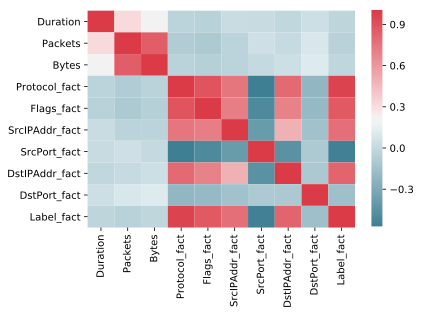

In [10]:
import seaborn as sns

corr_mat = df_scen10_nobg.reset_index().drop(['Date'], axis=1)
toFactorize = ['Protocol', 'Flags', 'SrcIPAddr', 'SrcPort', 'DstIPAddr', 'DstPort', 'Label']
for tf in toFactorize:
    corr_mat[tf+'_fact'] = pd.factorize(corr_mat[tf])[0]
corr = corr_mat.corr()

cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, cmap=cmap,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)
plt.savefig('flow_conf_mat.png')
plt.show()


In [11]:
toFactorize = ['Protocol', 'Flags']
for tf in toFactorize:
    df_scen10_nobg[tf] = pd.factorize(df_scen10_nobg[tf])[0]

df_scen10_nobg_inf = df_scen10_nobg[df_scen10_nobg['SrcIPAddr'] == INFECTED_HOSTS[0]]
df_scen10_nobg_norm = df_scen10_nobg[df_scen10_nobg['SrcIPAddr'] == NORMAL_HOSTS[0]]


/usr/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [12]:
display('infected', df_scen10_nobg_inf[['Packets', 'Bytes', 'Protocol', 'Flags']].describe())
display('clean', df_scen10_nobg_norm[['Packets', 'Bytes', 'Protocol', 'Flags']].describe())

plt.scatter(x=list(range(0,20980)),y=df_scen10_nobg_norm['Bytes'], c='red', marker='+')
plt.scatter(x=list(range(0,19889)),y=df_scen10_nobg_inf['Bytes'], c='blue', marker='.')
plt.title('Bytes')
plt.legend(labels=['Normal', 'Infected'])
plt.savefig('bytes_scatter.png')
plt.show()

plt.scatter(x=list(range(0,20980)),y=df_scen10_nobg_norm['Protocol'], c='red', marker='+')
plt.scatter(x=list(range(0,19889)),y=df_scen10_nobg_inf['Protocol'], c='blue', marker='.')
plt.title('Protocol')
plt.legend(labels=['Normal', 'Infected'])
plt.savefig('protocol_scatter.png')
plt.show()



'infected'

,Packets,Bytes,Protocol,Flags
count,19889.000000,19889.000000,19889.000000,19889.000000
mean,15.838705,14104.124943,1.941676,26.982050
std,102.152312,84291.197116,0.309928,10.914621
min,1.000000,60.000000,0.000000,0.000000
25%,1.000000,1066.000000,2.000000,17.000000
50%,1.000000,1066.000000,2.000000,33.000000
75%,1.000000,1066.000000,2.000000,35.000000
max,1000.000000,787188.000000,2.000000,72.000000


'clean'

,Packets,Bytes,Protocol,Flags
count,20980.000000,20980.000000,20980.00000,20980.000000
mean,8.289037,1051.229981,0.30715,4.143804
std,118.535209,9482.171590,0.46287,3.031612
min,1.000000,60.000000,0.00000,0.000000
25%,1.000000,66.000000,0.00000,1.000000
50%,1.000000,81.000000,0.00000,5.000000
75%,4.000000,272.000000,1.00000,6.000000
max,5206.000000,344234.000000,2.00000,31.000000


/home/wouter/.local/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:971: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  return_n_iter=True)


/home/wouter/.local/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:971: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return_n_iter=True)


/home/wouter/.local/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:971: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return_n_iter=True)


/home/wouter/.local/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:971: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  return_n_iter=True)


/home/wouter/.local/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:971: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return_n_iter=True)


/home/wouter/.local/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:971: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  return_n_iter=True)


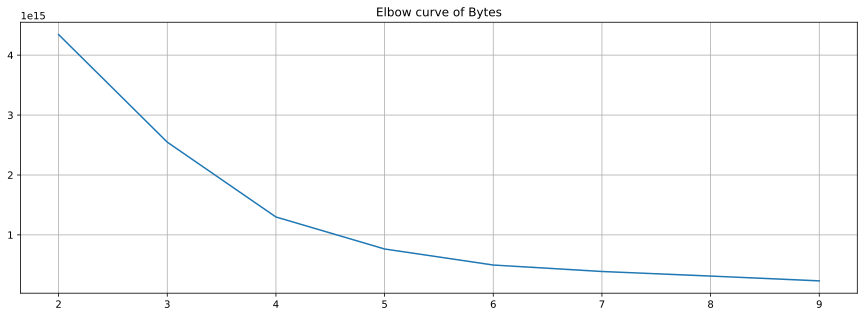

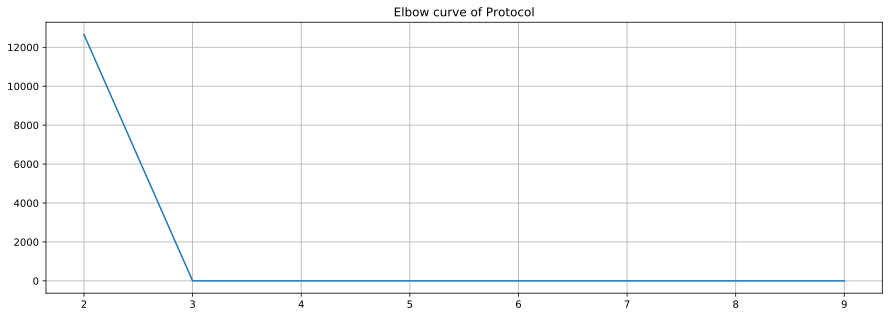

In [13]:
from sklearn.cluster import KMeans

for feat in ['Bytes', 'Protocol']:
    X = df_scen10_nobg[[feat]]
    distorsions = []
    maxClusters = 10
    for k in range(2, maxClusters):
        print('computing using {} clusters'.format(k), end='\r')
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(X)
        distorsions.append(kmeans.inertia_)

    fig = plt.figure(figsize=(15, 5))
    plt.plot(range(2, maxClusters), distorsions)
    plt.xticks(range(2, maxClusters))
    plt.grid(True)
    plt.title('Elbow curve of ' + feat)
    plt.savefig('elbow_{}.png'.format(feat))



In [14]:

def attributeEncoding(values, clusters):
    percentiles = np.arange(0, 100, 100/clusters)
    
    percentile_border = []
    for p in percentiles:
        percentile_border.append(np.percentile(values, p))
    encoded = np.zeros(len(values))
    for i, v in enumerate(values):
        for j, p in enumerate(percentile_border):
            if v > p:
                encoded[i] = j
                pass;
    
    return encoded        

inf_byte_codes = attributeEncoding(df_scen10_nobg_inf['Bytes'].values, 6)
inf_prot_codes = attributeEncoding(df_scen10_nobg_inf['Protocol'].values, 3)
inf_combined = np.add(inf_byte_codes, inf_prot_codes)

norm_byte_codes = attributeEncoding(df_scen10_nobg_norm['Bytes'].values, 6)
norm_prot_codes = attributeEncoding(df_scen10_nobg_norm['Protocol'].values, 3)
norm_combined = np.add(norm_byte_codes, norm_prot_codes)



In [15]:
# Botnet profiling
###############################
from hmmlearn import hmm

infected_discretized = pd.DataFrame(data = inf_combined, index = df_scen10_nobg_inf.index)
infected_discretized.head()

,0
Date,
2011-08-18 10:37:58.448,0.0
2011-08-18 10:38:00.695,0.0
2011-08-18 10:38:00.706,0.0
2011-08-18 10:38:03.255,0.0
2011-08-18 10:38:03.267,0.0


In [16]:
# Sliding window data
# paper: BClu used 2 minutes
WINDOW_WIDTH = 10
inf_sliding_window = infected_discretized.rolling(window=WINDOW_WIDTH, min_periods=1).mean()
inf_sliding_window.head()


,0
Date,
2011-08-18 10:37:58.448,0.0
2011-08-18 10:38:00.695,0.0
2011-08-18 10:38:00.706,0.0
2011-08-18 10:38:03.255,0.0
2011-08-18 10:38:03.267,0.0


In [17]:
model = hmm.GaussianHMM(n_components=4, covariance_type="full", n_iter=100)
model.fit(inf_sliding_window)

model_likelyhood = model.score(inf_sliding_window)




In [18]:
# Evaluate
def scoreForIP(ip):
    df_scen10_nobg_ip = df_scen10_nobg[df_scen10_nobg['SrcIPAddr'] == ip]

    if len(df_scen10_nobg_ip) == 0 :
        return np.nan

    byte_codes = attributeEncoding(df_scen10_nobg_ip['Bytes'].values, 6)
    prot_codes = attributeEncoding(df_scen10_nobg_ip['Protocol'].values, 3)
    combined = np.add(byte_codes, prot_codes)
    discretized = pd.DataFrame(data = combined, index = df_scen10_nobg_ip.index)
    sliding = discretized.rolling(window=WINDOW_WIDTH, min_periods=1).mean()

    return model.score(sliding)



In [19]:


TP, FP, TN, FN = 0 ,0 ,0 ,0
for inf in range(1, len(INFECTED_HOSTS)):
    score = scoreForIP(INFECTED_HOSTS[inf])
    if not np.isnan(score):
        if abs(model_likelyhood-score) > model_likelyhood:
            FN += 1
        else:
            TP += 1
    else:
        print('inf nan: {}'.format(inf))

for norm in NORMAL_HOSTS:
    score = scoreForIP(norm)
    if not np.isnan(score):
        if abs(model_likelyhood-score) > model_likelyhood:
            TN += 1
        else:
            print(norm, score)
            FP += 1
    else:
        print('norm nan: {}'.format(norm))

print('TP:{}\t FP:{}\nFN:{}\tTN:{}'.format(TP, FP, FN, TN))





norm nan: 147.32.87.11
TP:9	 FP:0
FN:0	TN:5


In [20]:
# Flow classification
###############################


from sklearn.model_selection import train_test_split, KFold, StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import roc_curve, auc, precision_recall_curve, confusion_matrix, accuracy_score, recall_score, precision_score

def plot_roc(fpr, tpr):
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([-0.01, 1.01])
    plt.ylim([-0.01, 1.01])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.grid(True)
    plt.show()

def plot_PRcurve(recall, precision):
    roc_auc = auc(recall, precision)
    plt.plot(recall, precision, 'r', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower left')
    plt.ylabel("Precision")
    plt.xlabel("Recall")
    plt.xlim([-0.01, 1.01])
    plt.ylim([-0.01, 1.01])
    plt.title("Precision-Recall curve")
    plt.grid(True)
plt.show()

def eval_classifier(clf, X_train, X_test, y_train, y_test):
    clf.fit(X_train, y_train)
    predictions = clf.predict(X_test)

    # ROC
    fpr, tpr, _ = roc_curve(y_test, predictions)
    plot_roc(fpr, tpr)
    
    # PR
    precision, recall, _ = precision_recall_curve(y_test, predictions)
    plot_PRcurve(recall, precision)
    
    # Confusion Matrix
    print("TN", "FP")
    print("FN", "TP")
    confmat = confusion_matrix(y_test, predictions.astype(int))
    print(pd.DataFrame(confmat))
    measures = {'Accuracy': accuracy_score,
                'Precision': precision_score,
                'Recall': recall_score}
    for name in measures:
        print(name, measures[name](y_test, predictions.astype(int)))




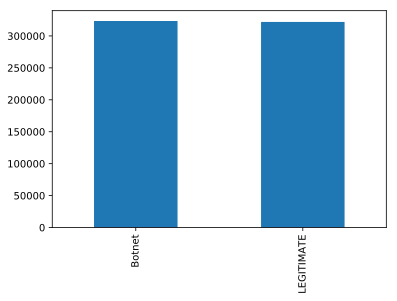

In [21]:
# Packet level classification
df_scen10_nobg = df_scen10[(df_scen10['Label'] != 'Background')]

# class imbalance check
df_scen10_nobg['Label'].value_counts().plot.bar()


In [22]:
# Process data
labels = df_scen10_nobg['Label'].apply(lambda x : 1 if int(x == 'Botnet') else 0)
features = df_scen10_nobg[['Duration', 'Protocol', 'Flags', 'Packets', 'Bytes', 'SrcIPAddr', 'SrcPort', 'DstIPAddr', 'DstPort']]
toFactorize = ['Flags', 'Protocol', 'SrcIPAddr', 'SrcPort', 'DstIPAddr', 'DstPort']
for tf in toFactorize:
    features[tf] = pd.factorize(features[tf])[0]



/usr/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [23]:
#  basic eval of classifier
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size = 0.4)


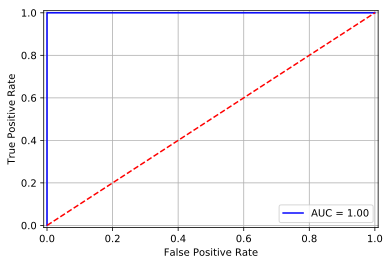

TN FP
FN TP
        0       1
0  128743       2
1       1  129398
Accuracy 0.9999883785793976
Precision 0.999984544049459
Recall 0.9999922719650075


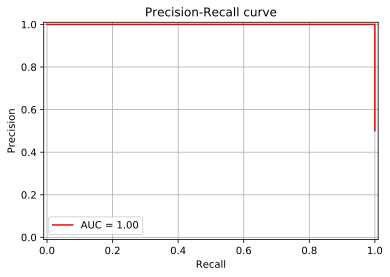

In [24]:
eval_classifier(RandomForestClassifier(n_estimators=20), X_train, X_test, y_train, y_test)



In [25]:
skf = StratifiedKFold(n_splits=10, shuffle=True)
split, totalTN, totalFP, totalFN, totalTP = 0,0,0,0,0
for train_index, test_index in skf.split(features, labels):
    split += 1
    #Select the data for this round
    X_train, X_test = features.iloc[train_index], features.iloc[test_index]    
    y_train, y_test = labels[train_index], labels[test_index]
    
    # Train classifier and predict
    clf = RandomForestClassifier(n_estimators=20)

    clf.fit(X_train, y_train)
    predictions = clf.predict(X_test)

    #Sum the confusion matrix values
    tn, fp, fn, tp = confusion_matrix(y_test, predictions.astype(int)).ravel()
    print('Split {}/10: \ntn {}\t fp {}\nfn {}\t\t tp {}'.format(split, tn, fp, fn, tp))
    totalTN += tn
    totalFP += fp
    totalFN += fn
    totalTP += tp

print("--- Total sum confmat ---")
print('tn {}\t fp {}\nfn {}\t\t tp {}'.format(totalTN, totalFP, totalFN, totalTP))

accuracy = (totalTP + totalTN) / (totalTP + totalTN + totalFN + totalFP)
precision = totalTP / (totalTP + totalFP)
recall = totalTP / (totalTP + totalFN)

print('accuracy\t{}\nprecision\t{}\nrecall\t{}'.format(accuracy, precision, recall))



Split 1/10: 
tn 32191	 fp 1
fn 0		 tp 32345
Split 2/10: 
tn 32192	 fp 0
fn 0		 tp 32344
Split 3/10: 
tn 32192	 fp 0
fn 1		 tp 32343
Split 4/10: 
tn 32192	 fp 0
fn 0		 tp 32344
Split 5/10: 
tn 32192	 fp 0
fn 1		 tp 32343
Split 6/10: 
tn 32192	 fp 0
fn 1		 tp 32343
Split 7/10: 
tn 32192	 fp 0
fn 0		 tp 32344
Split 8/10: 
tn 32190	 fp 1
fn 1		 tp 32343
Split 9/10: 
tn 32191	 fp 0
fn 1		 tp 32343
Split 10/10: 
tn 32191	 fp 0
fn 1		 tp 32343
--- Total sum confmat ---
tn 321915	 fp 2
fn 6		 tp 323435
accuracy	0.9999876037796076
precision	0.9999938164155616
recall	0.9999814494761022


In [26]:
# Host level classification

# To get information on a host level we aggregate by SrcIPAddr, and 
df_scen10_nobg_host = df_scen10_nobg.groupby(['SrcIPAddr']).agg({'Duration':'mean', 'Protocol':'nunique', 'Flags':'nunique', 'Packets':'mean', 'Bytes':'mean', 'SrcPort':'nunique', 'DstIPAddr':'nunique', 'DstPort':'nunique', 'Label':'unique'})
# df_scen10_nobg_host['MostProtocol'] = df_scen10_nobg.groupby('SrcIPAddr')['Protocol'].apply(lambda x: x.value_counts().index[0])


df_scen10_nobg_host['Label'] = df_scen10_nobg_host['Label'].apply(lambda x: (x[0] if x.shape == (1,) else 'Botnet'))


df_scen10_nobg_host.head()


,Duration,Protocol,Flags,Packets,Bytes,SrcPort,DstIPAddr,DstPort,Label
SrcIPAddr,,,,,,,,,
10.10.20.233,0.667947,1,3,1.76,116.16,23,1,1,LEGITIMATE
10.168.115.232,0.724800,1,1,1.80,155.60,1,1,1,LEGITIMATE
10.168.48.160,1.224250,1,1,1.50,133.50,1,1,1,LEGITIMATE
10.23.106.55,1.782500,1,1,3.00,255.50,1,1,1,LEGITIMATE
10.23.12.43,1.139000,1,1,1.50,395.75,2,2,2,LEGITIMATE


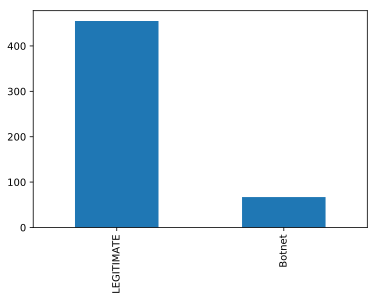

In [27]:
# class imbalance check
df_scen10_nobg_host['Label'].value_counts().plot.bar()


In [28]:
#resample features to balance classes
df_scen10_nobg_host['Label'] = df_scen10_nobg_host['Label'].apply(lambda x : 1 if int(x == 'Botnet') else 0)

labels = df_scen10_nobg_host['Label'].values
features = df_scen10_nobg_host.drop(['Label'], axis=1)

sm = SMOTE(random_state=42)
features, labels = sm.fit_resample(features, labels)

print('Legit(0)/Botnet(1)', Counter(labels))



Legit(0)/Botnet(1) Counter({0: 455, 1: 455})


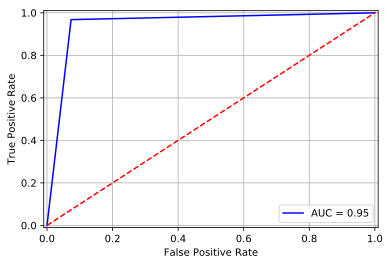

TN FP
FN TP
     0    1
0  164   13
1    6  181
Accuracy 0.9478021978021978
Precision 0.9329896907216495
Recall 0.9679144385026738


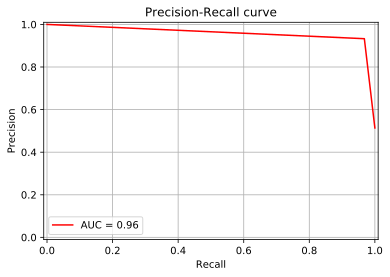

In [29]:
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size = 0.4)
eval_classifier(RandomForestClassifier(n_estimators=20), X_train, X_test, y_train, y_test)


In [30]:
skf = StratifiedKFold(n_splits=10, shuffle=True)
split, totalTN, totalFP, totalFN, totalTP = 0,0,0,0,0
for train_index, test_index in skf.split(features, labels):
    split += 1
    #Select the data for this round
    X_train = features[train_index,:]
    X_test = features[test_index,:]
    y_train = labels[train_index]
    y_test = labels[test_index]
    
    # Train classifier and predict
    clf = RandomForestClassifier(n_estimators=20)

    clf.fit(X_train, y_train)
    predictions = clf.predict(X_test)

    #Sum the confusion matrix values
    tn, fp, fn, tp = confusion_matrix(y_test, predictions.astype(int)).ravel()
    print('Split {}/10: \ntn {}\t fp {}\nfn {}\t\t tp {}'.format(split, tn, fp, fn, tp))
    totalTN += tn
    totalFP += fp
    totalFN += fn
    totalTP += tp

print("--- Total sum confmat ---")
print('tn {}\t fp {}\nfn {}\t\t tp {}'.format(totalTN, totalFP, totalFN, totalTP))

accuracy = (totalTP + totalTN) / (totalTP + totalTN + totalFN + totalFP)
precision = totalTP / (totalTP + totalFP)
recall = totalTP / (totalTP + totalFN)

print('accuracy\t{}\nprecision\t{}\nrecall\t{}'.format(accuracy, precision, recall))

Split 1/10: 
tn 45	 fp 1
fn 0		 tp 46
Split 2/10: 
tn 45	 fp 1
fn 2		 tp 44
Split 3/10: 
tn 44	 fp 2
fn 0		 tp 46
Split 4/10: 
tn 44	 fp 2
fn 0		 tp 46
Split 5/10: 
tn 44	 fp 2
fn 2		 tp 44
Split 6/10: 
tn 44	 fp 1
fn 1		 tp 44
Split 7/10: 
tn 43	 fp 2
fn 0		 tp 45
Split 8/10: 
tn 44	 fp 1
fn 2		 tp 43
Split 9/10: 
tn 40	 fp 5
fn 1		 tp 44
Split 10/10: 
tn 44	 fp 1
fn 2		 tp 43
--- Total sum confmat ---
tn 437	 fp 18
fn 10		 tp 445
accuracy	0.9692307692307692
precision	0.9611231101511879
recall	0.978021978021978
